Reading eigenvalues from ./CWNO_MIC_1_results.jld2


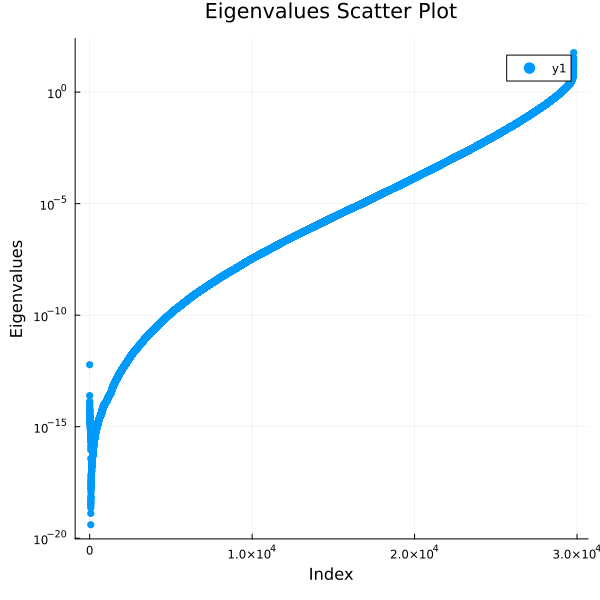

In [1]:
using Plots
using LinearAlgebra
using JLD2

# plot Eigenvalues
function read_eigenresults(number::Integer)
    output_file = "./CWNO_MIC_$(number)_results.jld2"
    println("Reading eigenvalues from $output_file")
    data = jldopen(output_file, "r")
    eigenvalues = data["eigenvalues"]
    close(data)
    return sort(eigenvalues)
end

eigenvalues = abs.(read_eigenresults(1))
xaxis = collect(1:length(eigenvalues))
scatter(xaxis, eigenvalues,
        title="Eigenvalues Scatter Plot",
        xlabel="Index",
        ylabel="Eigenvalues",
        markerstrokewidth=0,
        markersize=4,
        yscale = :log10,
        size=(600, 600))

# savefig("eigenvalues_scatter.png")
# println("Eigenvalues scatter plot saved to eigenvalues_scatter.png")

In [2]:
using Plots
using LinearAlgebra

"""
    load_matrix(filename::String; N::Int=29791, symmetrize::Bool=true)

Reads a binary matrix of Float64 values from file and reshapes it into an NxN matrix.
Optionally symmetrizes it to make it Hermitian.
"""
function load_matrix(filename::String; N::Int=29791, symmetrize::Bool=true)
    println("Reading $filename ...")
    open(filename, "r") do io
        data = read!(io, Array{Float64}(undef, N * N))
        A = reshape(data, N, N)
        if symmetrize
            A = 0.5 * (A + A')
        end
        return Hermitian(A)
    end
end

load_matrix

Reading ./CWNO_MIC1.dat ...


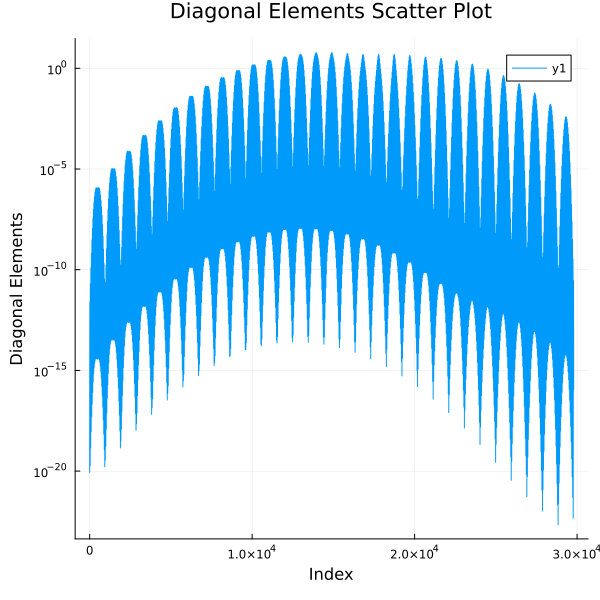

In [ ]:
# read matrix MIC
A = load_matrix("./CWNO_MIC1.dat"; N=29791)
D = diag(A)
plot(1:length(D), D,
        title="Diagonal Elements Scatter Plot",
        xlabel="Index",
        ylabel="Diagonal Elements",
        markerstrokewidth=0,
        markersize=4,
        yscale = :log10,
        size=(600, 600))

savefig("diagonal_elements_MIC1.png")

In [ ]:
# read matrix /home/fmereto/MA_best/Simulate_CWNO/CWNO_1.dat 
B = load_matrix("./CWNO_1.dat"; N=29791)
D2 = diag(B)
plot(1:length(D2), D2,
        title="Diagonal Elements Scatter Plot",
        xlabel="Index",
        ylabel="Diagonal Elements",
        markerstrokewidth=0,
        markersize=4,
        yscale = :log10,
        size=(600, 600))    
savefig("diagonal_elements_CWNO1.png")

In [ ]:
"""
    plot_squarematrix_magnitude(matrix::AbstractMatrix{<:Number}, filename::String; max_size::Int=2000)

Plots the magnitude (absolute value) of a square matrix.
If the matrix is too large, it is downsampled for visualization.
"""
function plot_squarematrix_magnitude(matrix::AbstractMatrix{<:Number}, filename::String; max_size::Int=2000)
    n = size(matrix, 1)
    magnitude_matrix = abs.(matrix)

    # Downsample if too large
    # if n > max_size
    #     step = cld(n, max_size)
    #     magnitude_matrix = magnitude_matrix[1:step:end, 1:step:end]
    #     println("Matrix downsampled from $n×$n to $(size(magnitude_matrix,1))×$(size(magnitude_matrix,2)) for plotting.")
    # end

    heatmap(
        magnitude_matrix,
        title = "Magnitude of the Matrix",
        xlabel = "Column Index",
        ylabel = "Row Index",
        colorbar_title = "Magnitude",
        aspect_ratio = :equal,
        size = (800, 800)
    )
    savefig(filename)
    println("Plot saved to $filename")
end

# A = load_matrix("./CWNO_MIC1.dat"; N=29791)
# plot_squarematrix_magnitude(A, "matrix_magnitude.png")